In [1]:
# install transformer moels
%pip install accelerate transformers bertopic top2vec[sentence_transformers]
%pip install -i https://pypi.org/simple/ bitsandbytes

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.7/143.7 kB 10.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 86.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 5.8 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple/
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.1/69.1 MB 11.1 MB/s eta 0:00:00


In [2]:
# import libraries
import warnings
import os
from torch import cuda
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import timeit
import platform
from pathlib import Path
from datetime import datetime

# Tokenization tools
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from string import punctuation
import re

# Scikit-Learn
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import CountVectorizer

# Coherence
import gensim.corpora as corpora
from gensim.models.coherencemodel import CoherenceModel
from gensim.utils import tokenize

# Word Clouds
from wordcloud import WordCloud

In [3]:
# class to calculate coherence score
class Metrics():

  def bert_coherence(self, sentences, topics):

    # Preprocess Documents
    documents = pd.DataFrame({
        "Document": sentences,
        "ID": range(len(sentences)),
        "Topic": topics}
    )
    documents_per_topic = documents.groupby(['Topic'], as_index=False).agg({'Document': ' '.join})
    cleaned_docs = BERTopic_model._preprocess_text(documents_per_topic.Document.values)

    # Extract vectorizer and analyzer from BERTopic
    vectorizer = BERTopic_model.vectorizer_model
    analyzer = vectorizer.build_analyzer()

    # Extract features for Topic Coherence evaluation
    words = vectorizer.get_feature_names_out()
    tokens = [analyzer(doc) for doc in cleaned_docs]
    dictionary = corpora.Dictionary(tokens)
    corpus = [dictionary.doc2bow(token) for token in tokens]
    topic_words = []
    for topic in set(topics):
        try:
            topic_data = BERTopic_model.get_topic(topic)
            if topic_data:  # Ensure the topic is valid
                topic_words.append([word for word, _ in topic_data])
        except Exception as e:
            print(f"Error processing topic {topic}: {e}")

    # Evaluate
    coherence_model = CoherenceModel(
        topics=topic_words,
        texts=tokens,
        corpus=corpus,
        dictionary=dictionary,
        coherence='c_v'
    )
    coherence = coherence_model.get_coherence()
    return coherence

  def t2v_coherence(self, sentences, topics):
      tokenized = [list(tokenize(doc)) for doc in sentences]
      id2word = corpora.Dictionary(tokenized)
      corpus = [id2word.doc2bow(text) for text in tokenized]

      # make sure you grab the topic words from the topic model and convert them to a list
      coherence_model = CoherenceModel(
          topics = topics,
          texts=tokenized,
          corpus=corpus,
          dictionary=id2word,
          coherence='c_v',
          topn=10
      )
      coherence = coherence_model.get_coherence()
      return coherence



In [4]:
# class to create wordclouds
class AllWordClouds():

    def lda_wordcloud(self, topic, lda_model):
        wordcloud = WordCloud(background_color="white", max_words=1000, contour_width=3, contour_color='steelblue')
        texts = [x[0] for x in lda_model.show_topic(topic)]
        long_string = ','.join(texts)
        wordcloud.generate(long_string)

        return wordcloud.to_image()


In [5]:
# read the dataset
data = pd.read_csv('boomlive_data_cleaned.csv', encoding='unicode_escape')
data.head()

,Category,Link,Heading,Sub_heading,Author,Date,Claim,Fact_check,Claim_summary,Claimed_by,Fact_check_summary,Links,Year,Month
0,fact check,https://www.boomlive.in/fact-check/awami-leagu...,bangladeshi actor being heckled on video false...,"according to local reports, mishti subas was c...",Archis Chowdhury,10/10/2024 14:16,video shows an american woman being heckled in...,boom identified the woman as bangladeshi actor...,video shows an american woman being heckled in...,social media users,FALSE,"['https://archive.is/607Xw', 'https://www.face...",2024,10
1,fast check,https://www.boomlive.in/fast-check/morphed-pho...,morphed photo falsely shared as patanjali sell...,boom found that the viral image was morphed fr...,Yangchula Bhutia,10/9/2024 13:33,an image showing a beef biryani spice mix with...,boom found that the viral image claiming patan...,a viral image claims that patanjali manufactur...,facebook,FALSE,NaN,2024,10
2,fact check,https://www.boomlive.in/fact-check/video-of-ma...,video of man killed by cousins in bangladesh f...,boom found that the deceased man's name is han...,Tausif Akbar,10/8/2024 18:36,video shows a hindu man killed by slitting his...,the incident happened because of personal enmi...,video shows body of a hindu man killed by slit...,"facebook users, x users",FALSE,[],2024,10
3,fact check,https://www.boomlive.in/fact-check/lebanon-tv-...,video from iraqi prank show peddled as lebanes...,boom found that the video is from an iraqi cha...,Nivedita Niranjankumar,10/8/2024 17:40,tv actress in lebanon slaps a maulvi for makin...,boom found that the video is from an iraqi cha...,lebanese tv actress slaps maulvi for insulting...,x and facebook users,FALSE,['https://youtu.be/fo-Dc6Hud5Q?si=knDtIUq-Vn4c...,2024,10
4,fact check,https://www.boomlive.in/fact-check/israel-pale...,viral claims of icj declaring israel an illega...,the icj ruling specifically pertains to israel...,Archis Chowdhury,10/8/2024 15:45,a video showing palestineâs foreign minister...,"the video is from july 2024, and shows the pal...",video shows palestinian foreign minister brief...,social media users,FALSE,['https://www.facebook.com/farjahan.shawon/vid...,2024,10


In [6]:
# first few claims
data['Claim'].head()

,Claim
0,video shows an american woman being heckled in...
1,an image showing a beef biryani spice mix with...
2,video shows a hindu man killed by slitting his...
3,tv actress in lebanon slaps a maulvi for makin...
4,a video showing palestineâs foreign minister...


In [7]:
# shape of the data
data.shape

(3133, 14)

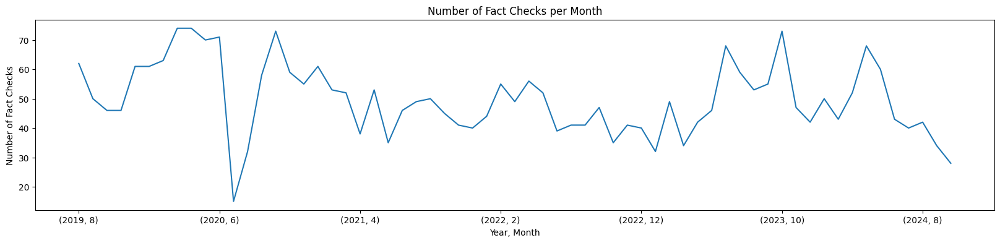

In [8]:
# plot the number of fact checks per month
plt.figure(figsize=(20, 4))
data.groupby(['Year', 'Month']).size().plot()
plt.title('Number of Fact Checks per Month')
plt.xlabel('Year, Month')
plt.ylabel('Number of Fact Checks')
plt.show()

**From the above plot the peaks represents:**   

February 2020 - April 2020: CAA NRC Protest   
March 2020 - November 2020: First wave of COVID-19  
October 2020 - January 2021: First Farmer's protest  
February 2024: Second farmers protest  
April 2024 - May 2024: Genereal election

<ipython-input-9-2228d33434d4>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Year', data=data, palette='coolwarm')


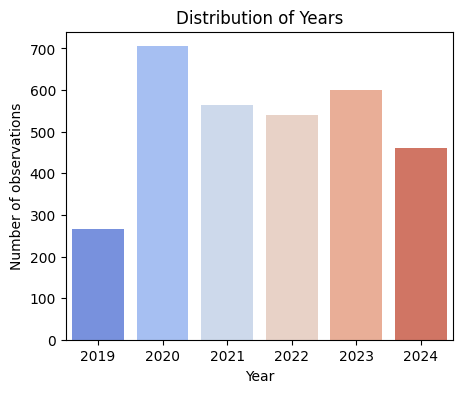

In [9]:
# histogram of the Year column using seaborn
plt.figure(figsize=(5, 4))
sns.countplot(x='Year', data=data, palette='coolwarm')
plt.title('Distribution of Years')
plt.xlabel('Year')
plt.ylabel('Number of observations')
plt.show()

<ipython-input-10-a08363cc2080>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Fact_check_summary', data=data, palette='coolwarm')


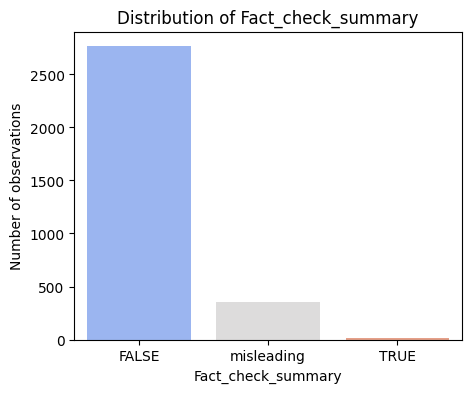

In [10]:
# histogram of the Fact_check_summary column using seaborn
plt.figure(figsize=(5, 4))
sns.countplot(x='Fact_check_summary', data=data, palette='coolwarm')
plt.title('Distribution of Fact_check_summary')
plt.xlabel('Fact_check_summary')
plt.ylabel('Number of observations')
plt.show()

In [11]:
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

### **Working on whole dataset**

In [12]:
# preprocess the text data
# remove stopwords
stop_words = set(stopwords.words('english'))

# extract the claims
claims = data['Claim']

# drop NaN values
claims = claims.dropna()


# Custom stopwords specific to misinformation data
custom_stopwords = {'claim', 'false', 'video', 'social', 'image', 'media', 'online', 'showing', 'shows', 'show', 'viral',
                    'share', 'shared'}
all_stopwords = stop_words.union(custom_stopwords)

# Sample data
claims = claims.apply(lambda x: " ".join([word for word in x.lower().split() if word not in all_stopwords]))

In [13]:
## lemmitization and stemming
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

# Lemmatization
lemmatizer = WordNetLemmatizer()
claims = claims.apply(lambda x: " ".join([lemmatizer.lemmatize(word) for word in x.split()]))
print(claims.head())

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


0     american woman heckled bangladesh wearing hijab.
1    beef biryani spice mix patanjali branding circ...
2    hindu man killed slitting throat front everyon...
3    tv actress lebanon slap maulvi making abusive ...
4    palestineâs foreign minister addressing fals...
Name: Claim, dtype: object


In [14]:
# create a list of strings of claims
claims = claims.tolist()

### **Clustering Algorithms on Embedding Spaces**

### **Top2Vec**

Top2Vec (https://github.com/ddangelov/Top2Vec) is an algorithm that simultaneously learns the topic representations and the word embeddings. By mapping documents to a continuous vector space, Top2Vec identifies clusters of documents that share similar themes without requiring a pre-defined number of topics. This approach allows for the discovery of natural and meaningful topics directly from the data.

Top2Vec involves the following steps:

1.  **Embedding Creation:** Top2Vec uses word embeddings to create document vectors.
2.  **Dimensionality Reduction:** The document vectors are reduced to a lower-dimensional space using techniques like UMAP.
3.  **Clustering:** The reduced vectors are clustered to identify topics.
4.  **Topic Words Identification:** The algorithm finds words that are closest to the cluster centroids, representing the topics.





### **Embeddings:** distiluse-base-multilingual-cased  

This is a sentence transformer model. It maps sentences & paragraphs to a 512 dimensional dense vector space and can be used for tasks like clustering or semantic search.

Author: Reimers, Nils and Gurevych, Iryna  
Proceedings of the 2019 Conference on Empirical Methods in Natural Language Processing  
Association for Computational Linguistics

In [15]:
# import top2vec package
from top2vec import Top2Vec

In [16]:
# choose the embedding model
embeddings = 'distiluse-base-multilingual-cased'

# train the Top2Vec model
min_word_count = 5

t2v_model = Top2Vec(
    documents=claims,
    embedding_model=embeddings,
    min_count=min_word_count
)

2024-12-06 14:26:05,148 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:521: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
2024-12-06 14:26:05,579 - top2vec - INFO - Downloading distiluse-base-multilingual-cased model
INFO:top2vec:Downloading distiluse-base-multilingual-cased model
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/341 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/2.39k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/607 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/539M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/528 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/996k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.96M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

2_Dense/config.json:   0%|          | 0.00/114 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.58M [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.58M [00:00<?, ?B/s]

rust_model.ot:   0%|          | 0.00/1.58M [00:00<?, ?B/s]

2024-12-06 14:26:14,732 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2024-12-06 14:26:20,335 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2024-12-06 14:26:44,606 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2024-12-06 14:26:44,772 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


In [17]:
topics = t2v_model.get_topics()

words_list = topics[0]
scores_list = topics[1]
topic_num_list = topics[2]
topic_size_list, _ = t2v_model.get_topic_sizes()

print(f'Top2Vec extracted {t2v_model.get_num_topics()} topics.\n')

for words, scores, topic_num in zip(words_list, scores_list, topic_num_list):
    df_vis = pd.DataFrame({'word': words, 'score': scores})
    topic_size = topic_size_list[topic_num]
    print(f'Topic {topic_num} ({topic_size} Claims):')
    print(df_vis.head(10), '\n')

Top2Vec extracted 27 topics.

Topic 0 (289 Claims):
         word     score
0    protests  0.376632
1  protesting  0.353763
2   protested  0.345525
3   protester  0.342400
4     protest  0.339874
5  protestors  0.332951
6      police  0.313923
7   policeman  0.299279
8      arrest  0.286961
9   arresting  0.281150 

Topic 1 (263 Claims):
        word     score
0   hinduism  0.313347
1   hindutva  0.302104
2      hindu  0.297289
3   islamist  0.286547
4    islamic  0.272411
5      islam  0.270123
6    islamia  0.269774
7     muslim  0.266760
8  muslimeen  0.265741
9    muslims  0.261982 

Topic 2 (259 Claims):
            word     score
0       kejriwal  0.349721
1       minister  0.345525
2  parliamentary  0.266568
3     parliament  0.264596
4      jharkhand  0.264009
5          hindu  0.261005
6          nehru  0.257266
7       governor  0.250637
8       hindutva  0.247067
9         bharat  0.242261 

Topic 3 (176 Claims):
         word     score
0    minister  0.337861
1    kejriwal 

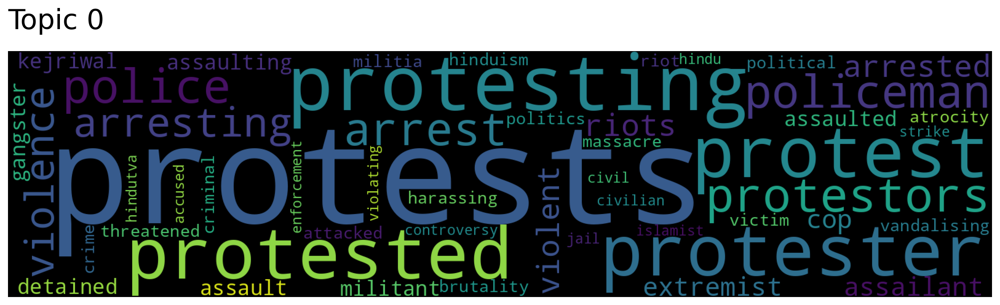

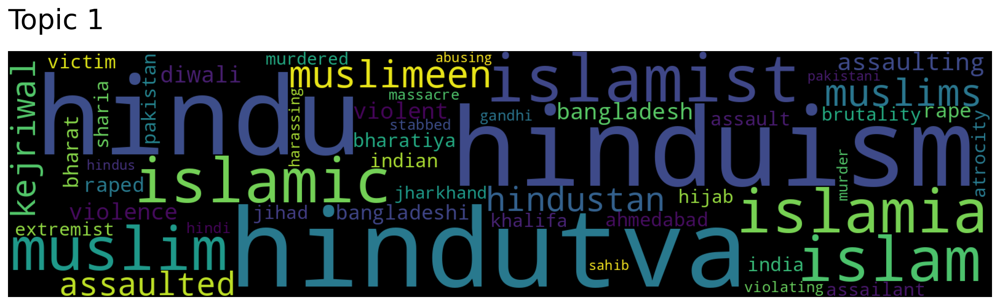

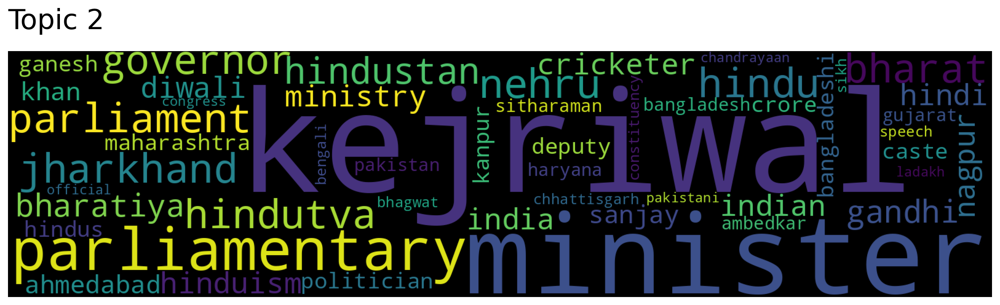

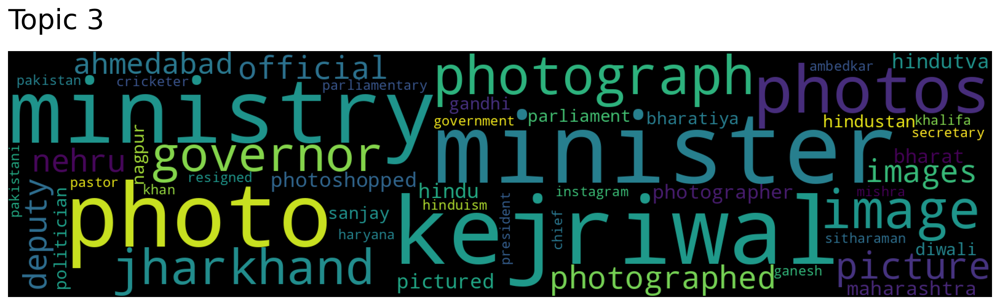

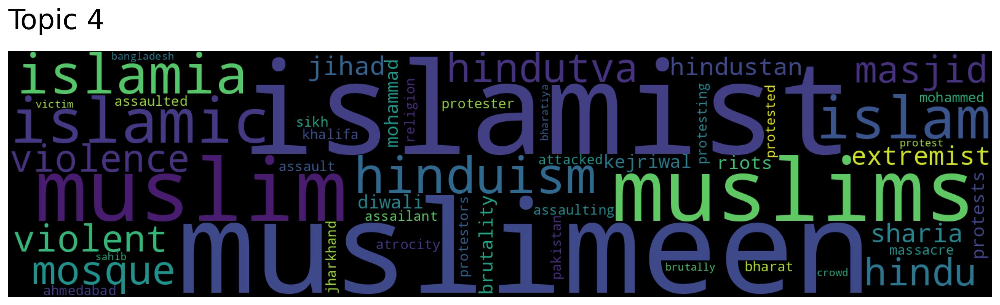

In [18]:
for topic in range(5):
    t2v_model.generate_topic_wordcloud(topic)


In [19]:
metrics = Metrics()
t2v_coherence = metrics.t2v_coherence(claims, t2v_model.get_topics()[0])

print("Top2Vec Model Coherence: ", round(t2v_coherence, 5))

Top2Vec Model Coherence:  0.40165


##**BERTopic**

BERTopic leverages transformer-based embeddings to create document representations and applies clustering algorithms to discover topics. It combines BERT embeddings with clustering techniques like HDBSCAN and dimensionality reduction methods like UMAP to generate coherent topics from text data.

BERTopic involves the following steps:

1.  **Embedding Creation:** BERTopic uses transformer models to create document embeddings.
2.  **Dimensionality Reduction:** The embeddings are reduced in dimensionality using UMAP.
3.  **Clustering:** Density-based clustering algorithm such as HDBSCAN are applied to form clusters from the reduced embeddings.
4.  **Topic Representation:** The algorithm generates topics based on the clustered documents and their embeddings. In this step, LLMs can be used for automatic and meaningful topic labeling.

### **Embedding:** paraphrase-multilingual-MiniLM-L12-v2  

This is a sentence-transformers model: It maps sentences & paragraphs to a 384 dimensional dense vector space and can be used for tasks like clustering or semantic search.

Author: Reimers, Nils and Gurevych, Iryna  
Proceedings of the 2019 Conference on Empirical Methods in Natural Language Processing  
Association for Computational Linguistics

In [22]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from umap import UMAP
from hdbscan import HDBSCAN
from torch import bfloat16
import transformers
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance, TextGeneration

In [23]:
# import the embedding_model
embeddings = SentenceTransformer("sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2")

# train the BERTopic model
min_topic_size = 30

BERTopic_model = BERTopic(
    embedding_model=embeddings,
    min_topic_size=min_topic_size,
    verbose=True
)
topics, probs = BERTopic_model.fit_transform(claims)

2024-12-06 14:35:14,299 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/92 [00:00<?, ?it/s]

2024-12-06 14:35:17,518 - BERTopic - Embedding - Completed ✓
2024-12-06 14:35:17,520 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-06 14:35:32,283 - BERTopic - Dimensionality - Completed ✓
2024-12-06 14:35:32,286 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-06 14:35:32,510 - BERTopic - Cluster - Completed ✓
2024-12-06 14:35:32,519 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-06 14:35:32,685 - BERTopic - Representation - Completed ✓


In [24]:
BERTopic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,1656,-1_old_minister_claiming_claim,"[old, minister, claiming, claim, india, indian...",[prime minister narendra modi saying people ch...
1,0,190,0_woman_man_hindu_muslim,"[woman, man, hindu, muslim, communal, disturbi...",[disturbing woman beaten group armed men woman...
2,1,121,1_photo_minister_prime_modi,"[photo, minister, prime, modi, narendra, gandh...",[photo time magazine cover prime minister nare...
3,2,119,2_covid_19_coronavirus_vaccine,"[covid, 19, coronavirus, vaccine, hospital, pa...","[message along dr. tarun kothari, known voice ..."
4,3,102,3_earthquake_cyclone_visuals_recent,"[earthquake, cyclone, visuals, recent, old, he...",[two unrelated visuals baby rescued debris air...
5,4,86,4_police_policeman_cop_officer,"[police, policeman, cop, officer, man, recent,...",[old police personnel kicked youth kanpur resu...
6,5,77,5_election_party_assembly_poll,"[election, party, assembly, poll, bjp, janata,...",[claiming graphic news minute (tnm) predicting...
7,6,71,6_twitter_tweet_account_fake,"[twitter, tweet, account, fake, impersonating,...",[several twitter user wednesday took dig delhi...
8,7,70,7_minister_modi_narendra_prime,"[minister, modi, narendra, prime, congress, pa...",[quote name former president india pratibha pa...
9,8,70,8_farmers_farmer_protest_ongoing,"[farmers, farmer, protest, ongoing, sikh, delh...",[two-year-old gathering farmer long march nash...


In [25]:
metrics = Metrics()
bert_coherence = metrics.bert_coherence(claims, topics)

print("BERTopic Model Metrics (Coherence): ", round(bert_coherence, 5))


BERTopic Model Metrics (Coherence):  0.6565


## **Lets work on 2024 data as we have some prior knowledge**

**Events happend in 2024:**
1.  2024 General Election in May-June
2.  Bangladesh's Political Unrest during August
3.  RG Kar Medical College Case

In [26]:
# get 2024 data
data_2024 = data[data['Year'] == 2024]
data_2024.head()

,Category,Link,Heading,Sub_heading,Author,Date,Claim,Fact_check,Claim_summary,Claimed_by,Fact_check_summary,Links,Year,Month
0,fact check,https://www.boomlive.in/fact-check/awami-leagu...,bangladeshi actor being heckled on video false...,"according to local reports, mishti subas was c...",Archis Chowdhury,10/10/2024 14:16,video shows an american woman being heckled in...,boom identified the woman as bangladeshi actor...,video shows an american woman being heckled in...,social media users,FALSE,"['https://archive.is/607Xw', 'https://www.face...",2024,10
1,fast check,https://www.boomlive.in/fast-check/morphed-pho...,morphed photo falsely shared as patanjali sell...,boom found that the viral image was morphed fr...,Yangchula Bhutia,10/9/2024 13:33,an image showing a beef biryani spice mix with...,boom found that the viral image claiming patan...,a viral image claims that patanjali manufactur...,facebook,FALSE,NaN,2024,10
2,fact check,https://www.boomlive.in/fact-check/video-of-ma...,video of man killed by cousins in bangladesh f...,boom found that the deceased man's name is han...,Tausif Akbar,10/8/2024 18:36,video shows a hindu man killed by slitting his...,the incident happened because of personal enmi...,video shows body of a hindu man killed by slit...,"facebook users, x users",FALSE,[],2024,10
3,fact check,https://www.boomlive.in/fact-check/lebanon-tv-...,video from iraqi prank show peddled as lebanes...,boom found that the video is from an iraqi cha...,Nivedita Niranjankumar,10/8/2024 17:40,tv actress in lebanon slaps a maulvi for makin...,boom found that the video is from an iraqi cha...,lebanese tv actress slaps maulvi for insulting...,x and facebook users,FALSE,['https://youtu.be/fo-Dc6Hud5Q?si=knDtIUq-Vn4c...,2024,10
4,fact check,https://www.boomlive.in/fact-check/israel-pale...,viral claims of icj declaring israel an illega...,the icj ruling specifically pertains to israel...,Archis Chowdhury,10/8/2024 15:45,a video showing palestineâs foreign minister...,"the video is from july 2024, and shows the pal...",video shows palestinian foreign minister brief...,social media users,FALSE,['https://www.facebook.com/farjahan.shawon/vid...,2024,10


In [27]:
data_2024.shape

(460, 14)

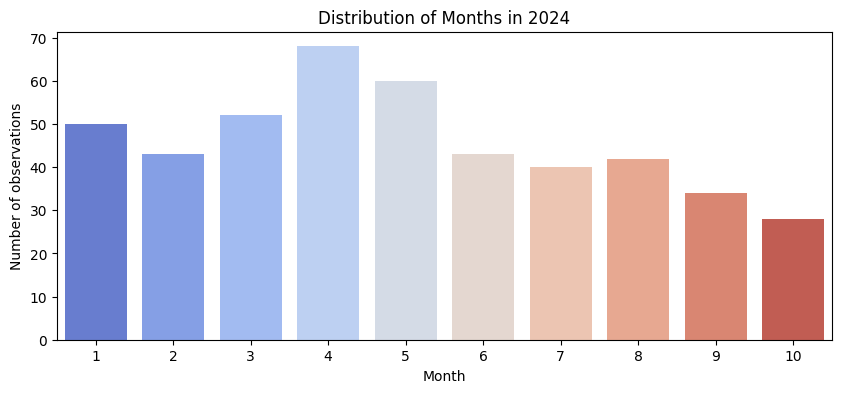

In [28]:
# histogram of the Month column using seaborn of year 2024
plt.figure(figsize=(10, 4))
sns.countplot(x='Month', data=data_2024, palette='coolwarm')
plt.title('Distribution of Months in 2024')
plt.xlabel('Month')
plt.ylabel('Number of observations')
plt.show()

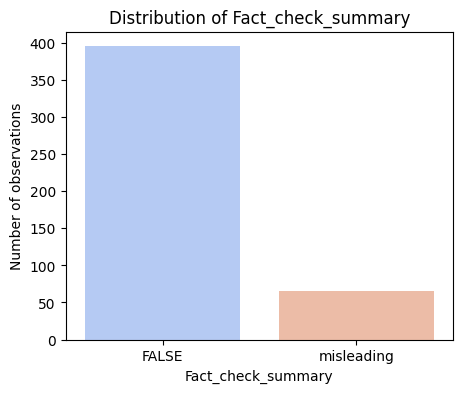

In [29]:
# distribution of fact-check summary
# histogram of the Fact_check_summary column using seaborn
plt.figure(figsize=(5, 4))
sns.countplot(x='Fact_check_summary', data=data_2024, palette='coolwarm')
plt.title('Distribution of Fact_check_summary')
plt.xlabel('Fact_check_summary')
plt.ylabel('Number of observations')
plt.show()

### **Categorize the data and evaluate befor, during and after the election**

**January - March** : Before election period  
**April - May** : Election period    
**June - September** : After election period  

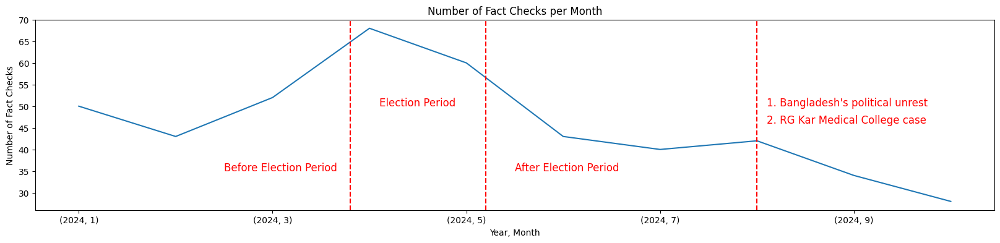

In [30]:
plt.figure(figsize=(20, 4))
data_2024.groupby(['Year', 'Month']).size().plot()
plt.title('Number of Fact Checks per Month')
plt.xlabel('Year, Month')
plt.ylabel('Number of Fact Checks')
plt.axvline(x=2.8, color='r', linestyle='--')
plt.axvline(x=4.2, color='r', linestyle='--')
plt.axvline(x=7, color='r', linestyle='--')
# add label to the election period in the plot inbetween the two red lines
plt.text(1.5, 35, 'Before Election Period', fontsize=12, color='r')
plt.text(3.1, 50, 'Election Period', fontsize=12, color='r')
plt.text(4.5, 35, 'After Election Period', fontsize=12, color='r')
plt.text(7.1, 50, "1. Bangladesh's political unrest", fontsize=12, color='r')
plt.text(7.1, 46, "2. RG Kar Medical College case", fontsize=12, color='r')
plt.show()

In [31]:
# get claims from 2024
claims_2024 = data_2024['Claim']

# drop NaN values
claims_2024 = claims_2024.dropna()

# remove stopwords
claims_2024 = claims_2024.apply(lambda x: " ".join([word for word in x.lower().split() if word not in all_stopwords]))

# lemmatization
claims_2024 = claims_2024.apply(lambda x: " ".join([lemmatizer.lemmatize(word) for word in x.split()]))

# create list
claims_2024 = claims_2024.tolist()

### **Top2Vec on 2024 data**

In [32]:
# choose the embedding model
embeddings = 'distiluse-base-multilingual-cased'

# train the Top2Vec model
min_word_count = 5

t2v_model_2024 = Top2Vec(
    documents=claims_2024,
    embedding_model=embeddings,
    min_count=min_word_count
)

2024-12-06 14:36:30,515 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
2024-12-06 14:36:30,585 - top2vec - INFO - Downloading distiluse-base-multilingual-cased model
INFO:top2vec:Downloading distiluse-base-multilingual-cased model
2024-12-06 14:36:34,056 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2024-12-06 14:36:35,012 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2024-12-06 14:36:36,834 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2024-12-06 14:36:36,858 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


In [33]:
topics_2024 = t2v_model_2024.get_topics()

words_list = topics_2024[0]
scores_list = topics_2024[1]
topic_num_list = topics_2024[2]
topic_size_list, _ = t2v_model_2024.get_topic_sizes()

print(f'Top2Vec extracted {t2v_model_2024.get_num_topics()} topics.\n')

for words, scores, topic_num in zip(words_list, scores_list, topic_num_list):
    df_vis = pd.DataFrame({'word': words, 'score': scores})
    topic_size = topic_size_list[topic_num]
    print(f'Topic {topic_num} ({topic_size} Claims):')
    print(df_vis.head(10), '\n')

Top2Vec extracted 3 topics.

Topic 0 (233 Claims):
         word     score
0    kejriwal  0.362413
1       hindu  0.291966
2   bharatiya  0.275021
3      gandhi  0.256834
4  parliament  0.248704
5      indian  0.237738
6       india  0.232573
7    election  0.230907
8   elections  0.230538
9       hindi  0.230089 

Topic 1 (159 Claims):
         word     score
0       hindu  0.358096
1  bangladesh  0.326329
2    kejriwal  0.318685
3      muslim  0.303518
4   bharatiya  0.296993
5     islamic  0.294231
6    pakistan  0.274938
7      indian  0.263674
8       india  0.259849
9   assaulted  0.250530 

Topic 2 (60 Claims):
         word     score
0       hindu  0.391526
1      indian  0.306041
2    kejriwal  0.305900
3   bharatiya  0.295083
4       india  0.293948
5    pakistan  0.285094
6      gandhi  0.264215
7       hindi  0.246180
8  protesting  0.229309
9    ceremony  0.227941 



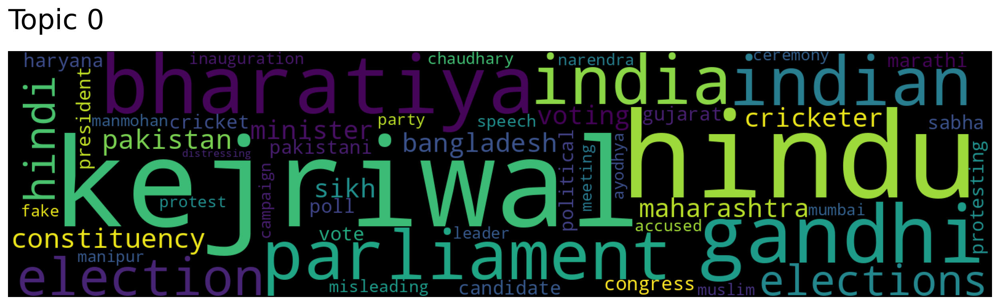

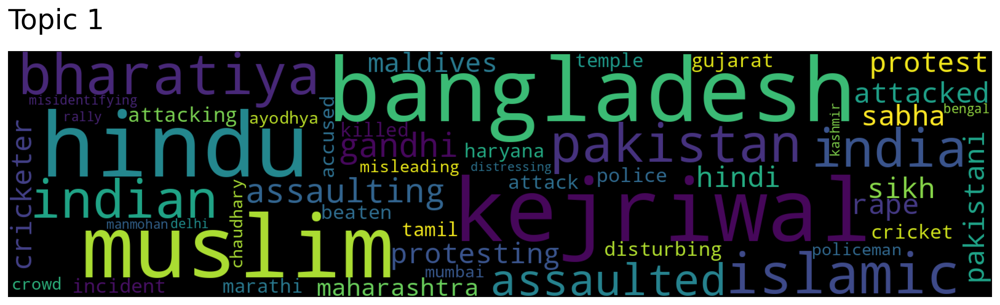

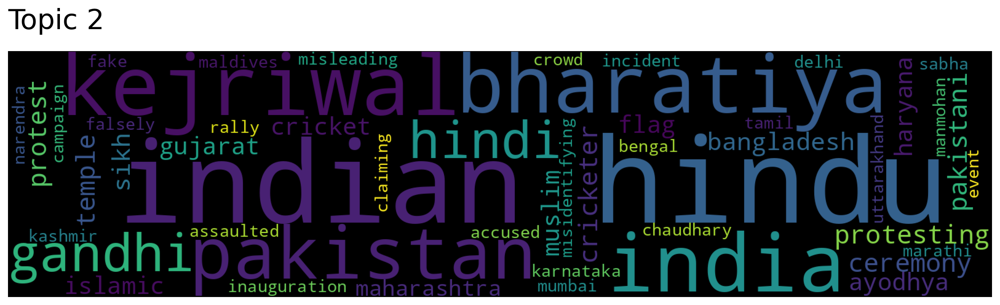

In [35]:
for topic in range(3):
    t2v_model_2024.generate_topic_wordcloud(topic)

In [36]:
metrics = Metrics()
t2v_coherence_2024 = metrics.t2v_coherence(claims_2024, t2v_model_2024.get_topics()[0])

print("Top2Vec Model Coherence: ", round(t2v_coherence_2024, 5))

Top2Vec Model Coherence:  0.32833


### **BERTopic on 2024 Data**

In [37]:
# import the embedding_model
embeddings = SentenceTransformer("sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2")

# train the BERTopic model
min_topic_size = 30

BERTopic_model = BERTopic(
    embedding_model=embeddings,
    min_topic_size=min_topic_size,
    verbose=True
)
topics_2024, probs_2024 = BERTopic_model.fit_transform(claims_2024)

2024-12-06 14:37:51,354 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/15 [00:00<?, ?it/s]

2024-12-06 14:37:52,066 - BERTopic - Embedding - Completed ✓
2024-12-06 14:37:52,070 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-06 14:37:53,633 - BERTopic - Dimensionality - Completed ✓
2024-12-06 14:37:53,635 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-06 14:37:53,657 - BERTopic - Cluster - Completed ✓
2024-12-06 14:37:53,662 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-06 14:37:53,697 - BERTopic - Representation - Completed ✓


In [38]:
BERTopic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,208,-1_old_muslim_man_minister,"[old, muslim, man, minister, police, falsely, ...","[newspaper clipping, purportedly published tel..."
1,0,181,0_party_minister_congress_modi,"[party, minister, congress, modi, prime, sabha...",[old photo president droupadi murmu prime mini...
2,1,63,1_woman_muslim_hindu_communal,"[woman, muslim, hindu, communal, group, men, b...",[west bengal's barasat district woman attacked...


In [39]:
metrics = Metrics()
bert_coherence_2024 = metrics.bert_coherence(claims_2024, topics_2024)

print("BERTopic Model Metrics (Coherence): ", round(bert_coherence_2024, 5))


BERTopic Model Metrics (Coherence):  0.52991


In [40]:
BERTopic_model.visualize_barchart()

**Topic 0:**  
Theme: Political Narratives  
- This topic revolves around political entities and figures, particularly Prime Minister Narendra Modi, the Congress Party, and parliamentary politics (e.g., Sabha).  
- Claims about leaders and parties are common, with misinformation likely targeting election campaigns, governance, or historical events (e.g., "old photo").  

**Topic 1:**  
Theme: Communal and Gender-Based Narratives  
- This topic focuses on communal tensions (e.g., Hindu-Muslim relations) and gender-based incidents (e.g., women targeted in communal violence).
- The mention of "Bangladesh" suggests cross-border narratives, possibly involving communal disputes or regional conflicts.

**Model training (fixed K)**  
We can force BERTopic to extract K Topics by setting an external Clustering Model.

In [41]:
cluster_model = KMeans(n_clusters=5)

umap = UMAP(
    n_neighbors=15,
    n_components=5,
    min_dist=0.0,
    metric='cosine',
    low_memory=False,
    random_state=42
)

BERTopic_model = BERTopic(
    embedding_model=embeddings,
    umap_model=umap,
    min_topic_size=30,
    hdbscan_model=cluster_model,
    verbose=True
)
topics, probs = BERTopic_model.fit_transform(claims_2024)

2024-12-06 14:38:18,998 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/15 [00:00<?, ?it/s]

2024-12-06 14:38:19,507 - BERTopic - Embedding - Completed ✓
2024-12-06 14:38:19,509 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-06 14:38:21,410 - BERTopic - Dimensionality - Completed ✓
2024-12-06 14:38:21,412 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-06 14:38:21,476 - BERTopic - Cluster - Completed ✓
2024-12-06 14:38:21,484 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-06 14:38:21,512 - BERTopic - Representation - Completed ✓


In [42]:
BERTopic_model.get_topic_info()


,Topic,Count,Name,Representation,Representative_Docs
0,0,110,0_party_election_lok_sabha,"[party, election, lok, sabha, janata, bjp, bha...",[old bharatiya janata party (bjp) worker chenn...
1,1,87,1_police_old_muslim_protest,"[police, old, muslim, protest, delhi, ongoing,...",[old group nihang sikh wielding sword attackin...
2,2,87,2_photo_former_ram_gandhi,"[photo, former, ram, gandhi, ayodhya, temple, ...",[old photograph former indian men's cricket te...
3,3,85,3_woman_hindu_muslim_communal,"[woman, hindu, muslim, communal, bangladesh, m...","[hindu woman assaulted bangladesh., disturbing..."
4,4,83,4_minister_modi_prime_narendra,"[minister, modi, prime, narendra, india, congr...",[cropped congress leader rahul gandhi mouthing...


In [43]:
metrics = Metrics()
bert_coherence_2024_fixed_k = metrics.bert_coherence(claims_2024, topics)

print("BERTopic Model Metrics (Coherence): ", round(bert_coherence_2024_fixed_k, 5))

BERTopic Model Metrics (Coherence):  0.5944


In [44]:
BERTopic_model.visualize_barchart()

**Topic 0:**  

Theme: Election and Party Politics  
- This topic highlights misinformation surrounding elections and political parties, particularly the BJP and Lok Sabha elections.
- Claims likely include fabricated or misleading narratives about political activities, alliances, or controversies targeting specific parties.

**Topic 1:**  

Theme: Protests and Communal Narratives  
- This topic revolves around police actions, communal incidents, and protests, often involving Muslim communities or events in Delhi.
- Claims may include recycled incidents framed in a communal or politically sensitive context.

**Topic 2:**   

Theme: Historical and Religious Narratives  
- This topic focuses on photos and historical narratives, often involving key religious or cultural icons like Ram (Ayodhya temple) and Gandhi.
- Claims likely use manipulated or misattributed photos to connect religious or cultural events with historical figures.

**Topic 3:**  

Theme: Communal and Gender-Based Narratives  
- This topic involves gender-based incidents framed in communal contexts, particularly between Hindu and Muslim communities or incidents in Bangladesh.
- Claims likely evoke strong emotional reactions by targeting sensitive social issues like violence against women.

**Topic 4:**  

Theme: Leadership and Political Figures  
- This topic centers on misinformation involving Prime Minister Narendra Modi, Congress leader Rahul Gandhi, and other political leaders.
- Claims are likely aimed at influencing perceptions of governance or leadership, using manipulated visuals or statements.

### **Partinoing the Data**
**January - March** : Before election period  
**April - May** : Election period    
**June - September** : After election period  

In [45]:
# categorize the data into before, during and after election period
data_before = data_2024[data_2024['Month'] <= 3]
print(data_before.shape)
data_during = data_2024[(data_2024['Month'] > 3) & (data_2024['Month'] <= 5)]
print(data_during.shape)
data_after = data_2024[data_2024['Month'] > 5]
print(data_after.shape)

(145, 14)
(128, 14)
(187, 14)


In [46]:
# aggregate the claims for each period
claims_before = data_before['Claim']
claims_during = data_during['Claim']
claims_after = data_after['Claim']

# drop NaN values
claims_before = claims_before.dropna()
claims_during = claims_during.dropna()
claims_after = claims_after.dropna()

# print the shape of the data
print("Befor:", claims_before.shape)
print("During:", claims_during.shape)
print("After:", claims_after.shape)

Befor: (143,)
During: (124,)
After: (185,)


In [47]:
# preprocess the text data
# remove stopwords
claims_before = claims_before.apply(lambda x: " ".join([word for word in x.lower().split() if word not in all_stopwords]))
claims_during = claims_during.apply(lambda x: " ".join([word for word in x.lower().split() if word not in all_stopwords]))
claims_after = claims_after.apply(lambda x: " ".join([word for word in x.lower().split() if word not in all_stopwords]))

# Lemmatization
claims_before = claims_before.apply(lambda x: " ".join([lemmatizer.lemmatize(word) for word in x.split()]))
claims_during = claims_during.apply(lambda x: " ".join([lemmatizer.lemmatize(word) for word in x.split()]))
claims_after = claims_after.apply(lambda x: " ".join([lemmatizer.lemmatize(word) for word in x.split()]))

### **BERTopic Implementation**

### **Before Election**

In [48]:
cluster_model = KMeans(n_clusters=4)

BERTopic_model = BERTopic(
    embedding_model=embeddings,
    umap_model=umap,
    min_topic_size=30,
    hdbscan_model=cluster_model,
    verbose=True
)

In [49]:
topics_before, probs_before = BERTopic_model.fit_transform(claims_before)

2024-12-06 14:39:04,408 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/5 [00:00<?, ?it/s]

2024-12-06 14:39:04,672 - BERTopic - Embedding - Completed ✓
2024-12-06 14:39:04,674 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-06 14:39:04,972 - BERTopic - Dimensionality - Completed ✓
2024-12-06 14:39:04,975 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-06 14:39:04,981 - BERTopic - Cluster - Completed ✓
2024-12-06 14:39:04,985 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-06 14:39:05,009 - BERTopic - Representation - Completed ✓


In [50]:
BERTopic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,0,55,0_minister_party_india_claiming,"[minister, party, india, claiming, modi, congr...",[fake quote attributed delhi chief minister ar...
1,1,36,1_ram_ayodhya_temple_misleading,"[ram, ayodhya, temple, misleading, indian, con...",[makeshift toilet setup swarved mahamandir var...
2,2,28,2_police_protest_ongoing_man,"[police, protest, ongoing, man, farmers, delhi...",[old group nihang sikh wielding sword attackin...
3,3,24,3_muslim_woman_hindu_girl,"[muslim, woman, hindu, girl, communal, old, me...",[distressing man brutally thrashed paddle lyin...


In [51]:
bert_coherence_before = metrics.bert_coherence(claims_before, topics_before)

print("BERTopic Model Metrics (Coherence): ", round(bert_coherence_before, 5))

BERTopic Model Metrics (Coherence):  0.65088


In [52]:
BERTopic_model.visualize_barchart()

### **During Election**

In [53]:
topics_during, probs_during = BERTopic_model.fit_transform(claims_during)

2024-12-06 14:39:17,079 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/4 [00:00<?, ?it/s]

2024-12-06 14:39:17,330 - BERTopic - Embedding - Completed ✓
2024-12-06 14:39:17,334 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-06 14:39:17,603 - BERTopic - Dimensionality - Completed ✓
2024-12-06 14:39:17,605 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-06 14:39:17,612 - BERTopic - Cluster - Completed ✓
2024-12-06 14:39:17,616 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-06 14:39:17,631 - BERTopic - Representation - Completed ✓


In [54]:
BERTopic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,0,34,0_party_lok_sabha_old,"[party, lok, sabha, old, elections, janata, bh...",[old group people recording accusing indian ar...
1,1,34,1_minister_modi_prime_narendra,"[minister, modi, prime, narendra, congress, le...",[delhi chief minister arvind kejriwal saying p...
2,2,31,2_woman_old_resurfaced_rally,"[woman, old, resurfaced, rally, student, commu...",[photograph featuring actor kangana ranaut rev...
3,3,25,3_fake_party_ai_bjp,"[fake, party, ai, bjp, claiming, election, voi...",[purporting news anchor sudhir chaudhary predi...


In [55]:
bert_coherence_during = metrics.bert_coherence(claims_during, topics_during)

print("BERTopic Model Metrics (Coherence): ", round(bert_coherence_during, 5))

BERTopic Model Metrics (Coherence):  0.60022


In [56]:
BERTopic_model.visualize_barchart()

### **After Election**

In [57]:
cluster_model = KMeans(n_clusters=3)

BERTopic_model = BERTopic(
    embedding_model=embeddings,
    umap_model=umap,
    min_topic_size=30,
    hdbscan_model=cluster_model,
    verbose=True
)

topics_after, probs_after = BERTopic_model.fit_transform(claims_after)

2024-12-06 14:39:32,512 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/6 [00:00<?, ?it/s]

2024-12-06 14:39:32,811 - BERTopic - Embedding - Completed ✓
2024-12-06 14:39:32,814 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-06 14:39:33,213 - BERTopic - Dimensionality - Completed ✓
2024-12-06 14:39:33,217 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-06 14:39:33,224 - BERTopic - Cluster - Completed ✓
2024-12-06 14:39:33,229 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-06 14:39:33,248 - BERTopic - Representation - Completed ✓


In [58]:
BERTopic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,0,73,0_gandhi_minister_leader_prime,"[gandhi, minister, leader, prime, sabha, congr...",[screenshot bharatiya janata party's website l...
1,1,56,1_woman_hindu_medical_college,"[woman, hindu, medical, college, communal, mus...","[hindu woman assaulted bangladesh., west benga..."
2,2,56,2_muslim_bangladesh_hindu_communal,"[muslim, bangladesh, hindu, communal, india, t...","[group men attempting demolish dargah guntur, ..."


In [59]:
bert_coherence_during = metrics.bert_coherence(claims_during, topics_during)

print("BERTopic Model Metrics (Coherence): ", round(bert_coherence_during, 5))

BERTopic Model Metrics (Coherence):  0.52518


In [60]:
BERTopic_model.visualize_barchart()

### **Top2Vec Implementation**

### **Before Election**

In [61]:
# choose the embedding model
embeddings = 'distiluse-base-multilingual-cased'

# train the Top2Vec model
min_word_count = 5

claims_before = claims_before.tolist()

t2v_model_before = Top2Vec(
    documents=claims_before,
    embedding_model=embeddings,
    min_count=min_word_count
)

2024-12-06 14:39:49,127 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
2024-12-06 14:39:49,143 - top2vec - INFO - Downloading distiluse-base-multilingual-cased model
INFO:top2vec:Downloading distiluse-base-multilingual-cased model
2024-12-06 14:39:50,748 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2024-12-06 14:39:51,079 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2024-12-06 14:39:51,302 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2024-12-06 14:39:51,313 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


In [62]:
topics_before = t2v_model_before.get_topics()

words_list = topics_before[0]
scores_list = topics_before[1]
topic_num_list = topics_before[2]
topic_size_list, _ = t2v_model_before.get_topic_sizes()

print(f'Top2Vec extracted {t2v_model_before.get_num_topics()} topics.\n')

for words, scores, topic_num in zip(words_list, scores_list, topic_num_list):
    df_vis = pd.DataFrame({'word': words, 'score': scores})
    topic_size = topic_size_list[topic_num]
    print(f'Topic {topic_num} ({topic_size} Claims):')
    print(df_vis.head(10), '\n')

Top2Vec extracted 2 topics.

Topic 0 (91 Claims):
         word     score
0       hindu  0.388977
1      indian  0.330477
2       india  0.318278
3      gandhi  0.291161
4    pakistan  0.248232
5   cricketer  0.218015
6      temple  0.168022
7  misleading  0.157709
8    ceremony  0.137896
9        fake  0.134088 

Topic 1 (52 Claims):
        word     score
0     muslim  0.243295
1      hindu  0.238826
2    protest  0.225844
3     police  0.208445
4  policeman  0.208215
5   pakistan  0.181368
6     indian  0.168074
7      india  0.158482
8     gandhi  0.151744
9    accused  0.150812 



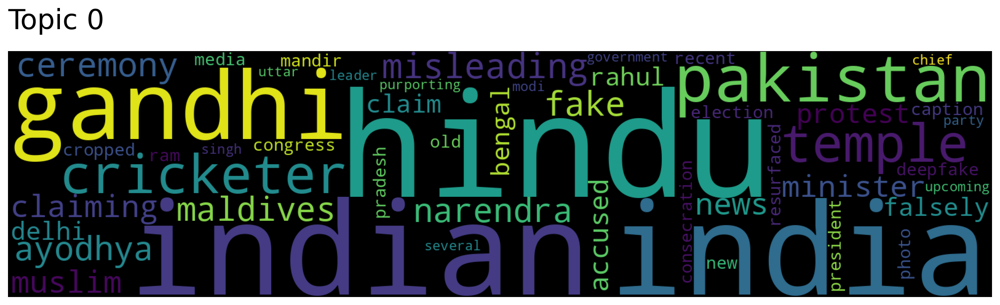

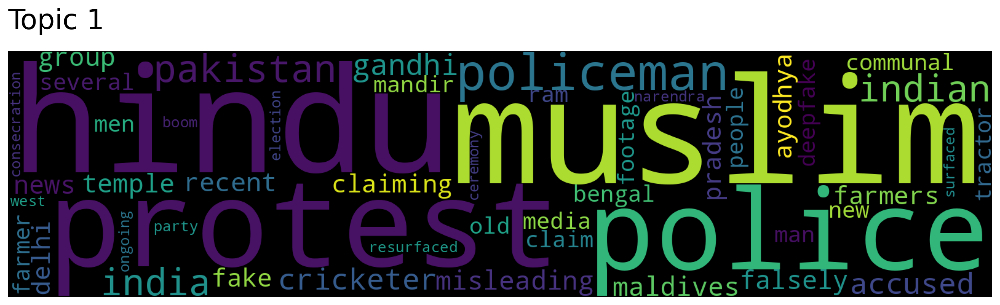

In [63]:
for topic in range(2):
    t2v_model_before.generate_topic_wordcloud(topic)

In [64]:
t2v_coherence_before = metrics.t2v_coherence(claims_before, t2v_model_before.get_topics()[0])

print("Top2Vec Model Coherence: ", round(t2v_coherence_before, 5))

Top2Vec Model Coherence:  0.30051


### **During Election**

In [65]:
claims_during = claims_during.tolist()

In [66]:
t2v_model_during = Top2Vec(
    documents=claims_during,
    embedding_model=embeddings,
    min_count=min_word_count
)

2024-12-06 14:40:19,420 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
2024-12-06 14:40:19,439 - top2vec - INFO - Downloading distiluse-base-multilingual-cased model
INFO:top2vec:Downloading distiluse-base-multilingual-cased model
2024-12-06 14:40:20,931 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2024-12-06 14:40:21,228 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2024-12-06 14:40:21,586 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2024-12-06 14:40:21,599 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


In [67]:
topics_during = t2v_model_during.get_topics()

words_list = topics_during[0]
scores_list = topics_during[1]
topic_num_list = topics_during[2]
topic_size_list, _ = t2v_model_during.get_topic_sizes()

print(f'Top2Vec extracted {t2v_model_during.get_num_topics()} topics.\n')

for words, scores, topic_num in zip(words_list, scores_list, topic_num_list):
    df_vis = pd.DataFrame({'word': words, 'score': scores})
    topic_size = topic_size_list[topic_num]
    print(f'Topic {topic_num} ({topic_size} Claims):')
    print(df_vis.head(10), '\n')

Top2Vec extracted 2 topics.

Topic 0 (64 Claims):
        word     score
0  elections  0.357959
1   election  0.351377
2   kejriwal  0.318456
3     voting  0.292171
4       vote  0.270882
5  bharatiya  0.267519
6      hindu  0.252269
7     gandhi  0.223635
8  candidate  0.219259
9      sabha  0.215368 

Topic 1 (60 Claims):
        word     score
0   kejriwal  0.350734
1      hindu  0.284569
2   minister  0.275026
3  bharatiya  0.258782
4     gandhi  0.239514
5     indian  0.228878
6      india  0.218472
7   pakistan  0.194416
8   congress  0.155065
9     speech  0.147957 



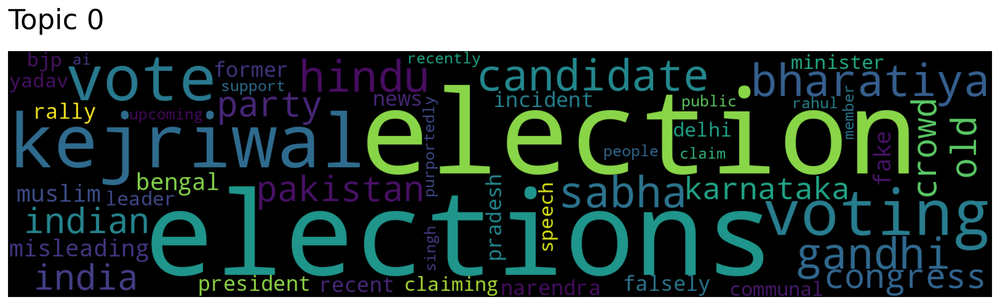

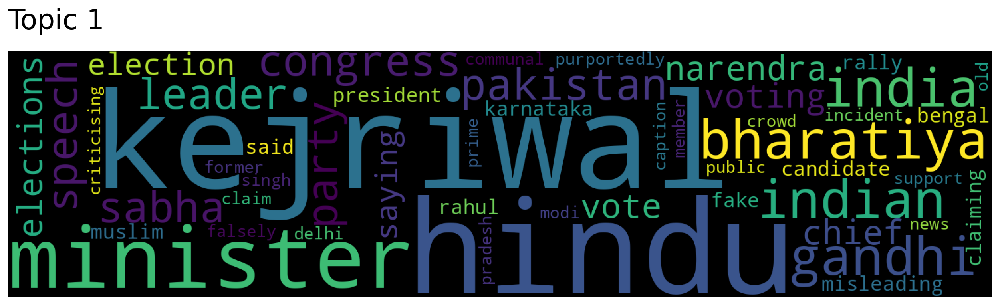

In [68]:
for topic in range(2):
    t2v_model_during.generate_topic_wordcloud(topic)

In [69]:
t2v_coherence_during = metrics.t2v_coherence(claims_during, t2v_model_during.get_topics()[0])

print("Top2Vec Model Coherence: ", round(t2v_coherence_during, 5))

Top2Vec Model Coherence:  0.35401


### **After Election**

In [70]:
claims_after = claims_after.tolist()

In [71]:
t2v_model_after = Top2Vec(
    documents=claims_after,
    embedding_model=embeddings,
    min_count=min_word_count
)

2024-12-06 14:40:48,459 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
2024-12-06 14:40:48,480 - top2vec - INFO - Downloading distiluse-base-multilingual-cased model
INFO:top2vec:Downloading distiluse-base-multilingual-cased model
2024-12-06 14:40:49,919 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2024-12-06 14:40:50,292 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2024-12-06 14:40:50,586 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2024-12-06 14:40:50,595 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


In [72]:
topics_after = t2v_model_after.get_topics()

words_list = topics_after[0]
scores_list = topics_after[1]
topic_num_list = topics_after[2]
topic_size_list, _ = t2v_model_after.get_topic_sizes()

print(f'Top2Vec extracted {t2v_model_after.get_num_topics()} topics.\n')

for words, scores, topic_num in zip(words_list, scores_list, topic_num_list):
    df_vis = pd.DataFrame({'word': words, 'score': scores})
    topic_size = topic_size_list[topic_num]
    print(f'Topic {topic_num} ({topic_size} Claims):')
    print(df_vis.head(10), '\n')

Top2Vec extracted 2 topics.

Topic 0 (112 Claims):
         word     score
0       hindu  0.412327
1  bangladesh  0.393271
2   bharatiya  0.350045
3      muslim  0.318003
4      indian  0.317788
5       india  0.315029
6     islamic  0.309940
7      gandhi  0.282515
8   assaulted  0.233933
9       sabha  0.206041 

Topic 1 (73 Claims):
         word     score
0       hindu  0.272581
1   bharatiya  0.257651
2      gandhi  0.253146
3    minister  0.223127
4      indian  0.216285
5    election  0.215929
6       india  0.213726
7   elections  0.211455
8  bangladesh  0.206158
9    congress  0.193662 



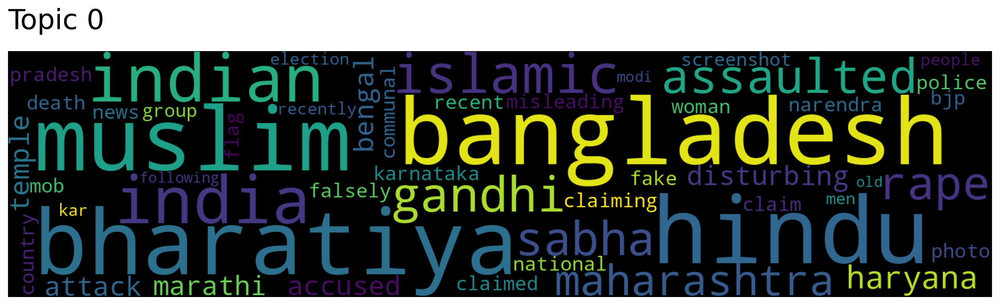

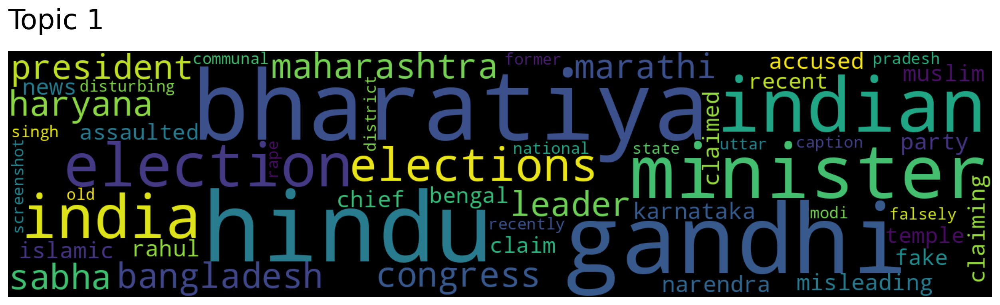

In [73]:
for topic in range(2):
    t2v_model_after.generate_topic_wordcloud(topic)

In [74]:
t2v_coherence_after = metrics.t2v_coherence(claims_after, t2v_model_after.get_topics()[0])

print("Top2Vec Model Coherence: ", round(t2v_coherence_after, 5))

Top2Vec Model Coherence:  0.29271


## **Dynamic Topic Modeling**

Dynamic topic modeling (DTM) is a collection of techniques aimed at analyzing the evolution of topics over time. These methods allow you to understand how a topic is represented across different times. For example, in 1995 people may talk differently about environmental awareness than those in 2015. Although the topic itself remains the same, environmental awareness, the exact representation of that topic might differ.

there are two main ways to further fine-tune these specific topic representations, namely **globally** and **evolutionary**.

- A topic representation at timestep t can be fine-tuned globally by averaging its c-TF-IDF representation with that of the global representation. This allows each topic representation to move slightly towards the global representation whilst still keeping some of its specific words.

- A topic representation at timestep t can be fine-tuned evolutionary by averaging its c-TF-IDF representation with that of the c-TF-IDF representation at timestep t-1. This is done for each topic representation allowing for the representations to evolve over time.

In [76]:
claims[:5]

['american woman heckled bangladesh wearing hijab.',
 'beef biryani spice mix patanjali branding circulating indian company, known promoting traditional values, manufacturing selling product. includes word â\x80\x9cbeef biryaniâ\x80\x9d patanjali logos, leading outrage accusation hypocrisy brand.',
 'hindu man killed slitting throat front everyone eidgah gate kauria para narsingdi district bangladesh',
 'tv actress lebanon slap maulvi making abusive comment towards her.',
 'palestineâ\x80\x99s foreign minister addressing falsely claim international court justice declared israel illegal state.']

In [78]:
len(claims)

2939

In [79]:
# get the dates from the data and drop those who has empty claims
data_cleaned = data.dropna(subset=['Claim'])
dates = data_cleaned['Date']

In [80]:
len(dates)

2939

In [81]:
timestamps = dates.to_list()

1. **we need to extract the global topic representations by simply creating and training a BERTopic model**

In [82]:
# import the embedding_model
embeddings = SentenceTransformer("sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2")

# train the BERTopic model
min_topic_size = 30

BERTopic_model = BERTopic(
    embedding_model=embeddings,
    min_topic_size=min_topic_size,
    verbose=True
)
topics_dtm, probs_dtm = BERTopic_model.fit_transform(claims)

2024-12-06 14:54:46,438 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/92 [00:00<?, ?it/s]

2024-12-06 14:54:49,705 - BERTopic - Embedding - Completed ✓
2024-12-06 14:54:49,707 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-06 14:55:04,441 - BERTopic - Dimensionality - Completed ✓
2024-12-06 14:55:04,442 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-06 14:55:04,569 - BERTopic - Cluster - Completed ✓
2024-12-06 14:55:04,575 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-06 14:55:04,669 - BERTopic - Representation - Completed ✓


In [84]:
BERTopic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,1576,-1_minister_old_claiming_india,"[minister, old, claiming, india, claim, party,...",[old kolkata circulating misleading recent vis...
1,0,202,0_amendment_protest_citizenship_rally,"[amendment, protest, citizenship, rally, act, ...",[old anti-caa (citizen amendment act) rally he...
2,1,189,1_woman_man_muslim_hindu,"[woman, man, muslim, hindu, communal, disturbi...",[disturbing woman beaten group armed men woman...
3,2,126,2_photo_minister_prime_modi,"[photo, minister, prime, modi, narendra, gandh...",[morphed prime minister narendra modi's photo ...
4,3,120,3_covid_19_coronavirus_vaccine,"[covid, 19, coronavirus, vaccine, hospital, ou...","[map india around media, state compared countr..."
5,4,90,4_earthquake_cyclone_recent_heavy,"[earthquake, cyclone, recent, heavy, old, visu...","[several old video gujarat, rajasthan, massach..."
6,5,87,5_police_policeman_cop_recent,"[police, policeman, cop, recent, man, officer,...",[old police officer trampling person's face ca...
7,6,79,6_election_party_assembly_poll,"[election, party, assembly, poll, bjp, sabha, ...",[graphic claiming opinion poll predicting aam ...
8,7,74,7_twitter_tweet_account_fake,"[twitter, tweet, account, fake, impersonating,...",[several twitter user wednesday took dig delhi...
9,8,71,8_game_fighter_helicopter_air,"[game, fighter, helicopter, air, missile, hama...","[user generated clip, using game 'digital flig..."


**2. From these topics, we are going to generate the topic representations at each timestamp for each topic.**

## **Bins**

If you have more than 100 unique timestamps, then there will be topic representations created for each of those timestamps which can negatively affect the topic representations. It is advised to keep the number of unique timestamps below 50. To do this, you can simply set the number of bins that are created when calculating the topic representations. The timestamps will be taken and put into equal-sized bins.

In [83]:
topics_over_time = BERTopic_model.topics_over_time(claims, timestamps, nr_bins=20)

20it [00:00, 25.88it/s]


In [85]:
BERTopic_model.visualize_topics_over_time(topics_over_time, top_n_topics=20)

In [86]:
BERTopic_model.visualize_topics_over_time(topics_over_time, topics=[0, 1, 2, 3, 6, 9, 11])

In [91]:
BERTopic_model.visualize_topics_over_time(topics_over_time, topics=[0])

The topic and plot is referring to narratives related to **citizenship amendment act** protests and associated rallies/events.  

- The topic saw a significant peak in early 2020, indicating a surge in discussions or misinformation about citizenship amendments and related protests.
- This aligns with real-world events such as protests against the Citizenship Amendment Act (CAA) and related rallies that occurred prominently in early 2020.
- The topic's prevalence dropped sharply after mid-2020, likely reflecting a decline in public interest or media coverage as the protests subsided.
- A minor increase in early 2024 could indicate renewed interest or misinformation tied to elections or political narratives leveraging the CAA protests as a reference point.

In [92]:
BERTopic_model.visualize_topics_over_time(topics_over_time, topics=[1])

The topic likely reflects **gender-based and communal narratives** involving **Hindu-Muslim** relations.  

- The topic shows a relatively stable frequency in early 2020, indicating consistent discussions around gender and communal narratives during this period.
- The topic exhibits cyclical spikes, particularly in mid-2020, late 2021, mid-2022, and late 2023. These peaks suggest that specific events or incidents periodically reignited public interest or misinformation related to communal or gender-based themes.
- The topic shows a sharp upward trend in late 2023 and peaks in mid-2024. This may align with politically or socially significant events (e.g., elections or communal incidents) that amplified gender- and religion-based narratives.

In [93]:
BERTopic_model.visualize_topics_over_time(topics_over_time, topics=[3])

This topic focusing on narratives related to **COVID-19, vaccination**  

- The topic exhibits a steep increase in early 2020, peaking around mid-2020. This aligns with the outbreak of the COVID-19 pandemic and the subsequent surge in public interest, misinformation, and conspiracy theories surrounding the virus.
- The prevalence of the topic declines sharply after mid-2020, coinciding with the normalization of pandemic-related narratives as public awareness and understanding improved.
- By 2021, the frequency further diminishes, reflecting reduced urgency and media attention on COVID-19 misinformation.
- The topic becomes almost non-existent in 2022, indicating a significant drop in COVID-19-related misinformation. This may be due to:
Widespread vaccination campaigns and increased public knowledge,
Misinformation narratives shifting focus to other socio-political topics.

In [94]:
BERTopic_model.visualize_topics_over_time(topics_over_time, topics=[9])

The topic focusing on narratives related to **farmers' protests**  

- The topic begins to gain traction gradually throughout 2020, reflecting early discussions and misinformation about the farmers' protests as they started to emerge as a significant issue.
- The topic reaches its highest prevalence in early 2021, coinciding with the massive farmers' protests in India against the controversial farm laws introduced by the government.
This peak likely reflects misinformation and narratives around the protests, such as claims about the farmers' demands, political involvement, or violence during the protests.
- The topic remains at a negligible level throughout 2022 and early 2023, suggesting that the issue had largely receded from public and media attention.
- A minor uptick is observed in late 2023 and early 2024, represent the second farmer protest.

In [95]:
BERTopic_model.visualize_topics_over_time(topics_over_time, topics=[6])

The topic focusing on narratives related to **elections, political parties, and assembly polls**.  

- The topic shows a slow but steady rise throughout 2020, reflecting early discussions or misinformation narratives related to elections and political parties.
- A prominent peak is observed in early 2022, aligning with key elections or political campaigns, such as state assembly elections in India (e.g., Uttar Pradesh, Punjab).
- From mid-2022 through early 2023, the topic exhibits smaller, periodic spikes, suggesting sustained but less intense discussions, likely tied to smaller elections or ongoing political narratives.
- A significant surge occurs in late 2023, peaking in early 2024. This aligns with the build-up to national elections in India and the resurgence of election-related misinformation.
- The steep drop after early 2024 indicates the conclusion of the election season, as public interest and misinformation around the topic subsided.

